<a href="https://colab.research.google.com/github/nicholicaron/JustKnowStuff/blob/main/2_PT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import os
import math
import numpy as np
import time

## Imports for plotting
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg', 'pdf') # For export
from matplotlib.colors import to_rgba
import seaborn as sns
sns.set()

## Progress bar
from tqdm.notebook import tqdm

<ipython-input-2-5b602ad12930>:10: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('svg', 'pdf') # For export


In [3]:
import torch
print("Using torch, ", torch.__version__)

Using torch,  2.5.1+cu121


In [5]:
torch.manual_seed(42) # Setting the seed

In [7]:
x = torch.Tensor(2,3,4)
print(x)

tensor([[[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]],

        [[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]]])


In [8]:
# Create a tensor from a (nested) list
x = torch.Tensor([[1., 2.], [3,4]])
print(x)

tensor([[1., 2.],
        [3., 4.]])


In [9]:
# Create a tensor with random values between 0 and 1 with the shape [2,3,4]
x = torch.rand(2,3,4)
print(x)

tensor([[[0.8823, 0.9150, 0.3829, 0.9593],
         [0.3904, 0.6009, 0.2566, 0.7936],
         [0.9408, 0.1332, 0.9346, 0.5936]],

        [[0.8694, 0.5677, 0.7411, 0.4294],
         [0.8854, 0.5739, 0.2666, 0.6274],
         [0.2696, 0.4414, 0.2969, 0.8317]]])


In [11]:
shape = x.shape
print("Shape: ", shape)

size = x.size()
print("Size: ", size)

dim1, dim2, dim3 = x.size()
print("Size: ", dim1, dim2, dim3)

Shape:  torch.Size([2, 3, 4])
Size:  torch.Size([2, 3, 4])
Size:  2 3 4


In [12]:
np_arr = np.array([[1,2],[3,4]])
tensor = torch.from_numpy(np_arr)

print("Numpy Array: ", np_arr)
print("Pytorch Tensor: ", tensor)

Numpy Array:  [[1 2]
 [3 4]]
Pytorch Tensor:  tensor([[1, 2],
        [3, 4]])


In [14]:
tensor = torch.arange(4)
np_arr = tensor.numpy()

print("PyTorch Tensor: ", tensor)
print("Numpy array: ", np_arr)

PyTorch Tensor:  tensor([0, 1, 2, 3])
Numpy array:  [0 1 2 3]


In [15]:
x1 = torch.rand(2,3)
x2 = torch.rand(2,3)
y = x1 + x2

print("X1", x1)
print("X2", x2)
print("Y", y)

X1 tensor([[0.1053, 0.2695, 0.3588],
        [0.1994, 0.5472, 0.0062]])
X2 tensor([[0.9516, 0.0753, 0.8860],
        [0.5832, 0.3376, 0.8090]])
Y tensor([[1.0569, 0.3448, 1.2448],
        [0.7826, 0.8848, 0.8151]])


In [16]:
x1 = torch.rand(2,3)
x2 = torch.rand(2,3)

print("X1 (before)", x1)
print("X2 (before)", x2)

x2.add_(x1)
print("X1 (after)", x1)
print("X2 (after)", x2)

X1 (before) tensor([[0.5779, 0.9040, 0.5547],
        [0.3423, 0.6343, 0.3644]])
X2 (before) tensor([[0.7104, 0.9464, 0.7890],
        [0.2814, 0.7886, 0.5895]])
X1 (after) tensor([[0.5779, 0.9040, 0.5547],
        [0.3423, 0.6343, 0.3644]])
X2 (after) tensor([[1.2884, 1.8504, 1.3437],
        [0.6237, 1.4230, 0.9539]])


In [18]:
x = torch.arange(6)
print("X", x)

y = x.view(2,3)
print("Y", y)

z = y.permute(1,0) # Swapping dimension 0 and 1
print("Z", z)

X tensor([0, 1, 2, 3, 4, 5])
Y tensor([[0, 1, 2],
        [3, 4, 5]])
Z tensor([[0, 3],
        [1, 4],
        [2, 5]])


In [19]:
x = torch.arange(6)
x = x.view(2,3)
print("X", x)

W = torch.arange(9).view(3,3) # We can also stack multiple operations in a single line
print("W", W)

h = torch.matmul(x, W)
print("h", h)

X tensor([[0, 1, 2],
        [3, 4, 5]])
W tensor([[0, 1, 2],
        [3, 4, 5],
        [6, 7, 8]])
h tensor([[15, 18, 21],
        [42, 54, 66]])


In [20]:
x = torch.arange(12).view(3,4)
print("X", x)
print(x[:,1]) # Second column
print(x[0]) # First row
print(x[:2, -1]) # First two rows, last column
print(x[1:3, :]) # Last two rows

X tensor([[ 0,  1,  2,  3],
        [ 4,  5,  6,  7],
        [ 8,  9, 10, 11]])
tensor([1, 5, 9])
tensor([0, 1, 2, 3])
tensor([3, 7])
tensor([[ 4,  5,  6,  7],
        [ 8,  9, 10, 11]])


In [21]:
x = torch.ones((3,))
print(x.requires_grad)

False


In [22]:
x.requires_grad_(True)
print(x.requires_grad)

True


In [23]:
x = torch.arange(3, dtype=torch.float32, requires_grad=True) # Only float tensors can have gradients
print("X", x)

X tensor([0., 1., 2.], requires_grad=True)


In [24]:
a = x + 2
b = a ** 2
c = b + 3
y = c.mean()
print("Y", y)

Y tensor(12.6667, grad_fn=<MeanBackward0>)


In [25]:
y.backward()

In [26]:
print(x.grad)

tensor([1.3333, 2.0000, 2.6667])


In [27]:
gpu_avail = torch.cuda.is_available()
print(f"Is the GPU available? {gpu_avail}")

Is the GPU available? False


In [4]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print("Device", device)

Device cuda


In [5]:
x = torch.zeros(2,3)
x = x.to(device)
print("X", x)

X tensor([[0., 0., 0.],
        [0., 0., 0.]], device='cuda:0')


In [6]:
x = torch.randn(5000, 5000)

## CPU
start_time = time.time()
_ = torch.matmul(x,x)
end_time = time.time()
print(f"CPU time: {(end_time - start_time):6.5f}s")

# GPU
x = x.to(device)
_ = torch.matmul(x, x) # First operation to 'burn in' GPU -- Kinda cheating lol
# CUDA is asynchronous, so we need to use different timing functions
start = torch.cuda.Event(enable_timing=True)
end = torch.cuda.Event(enable_timing=True)
start.record()
_ = torch.matmul(x,x)
end.record()
torch.cuda.synchronize() # Waits for everything to finish running on the GPU
print(f"GPU time: {0.001 * start.elapsed_time(end):6.5f}s")

CPU time: 3.04100s
GPU time: 0.08283s


In [7]:
# GPU operations have a separate seed we also want to set
if torch.cuda.is_available():
  torch.cuda.manual_seed(42)
  torch.cuda.manual_seed_all(42)

# Additionally, some operations on a GPU are implemented stochastic for efficiency
# We want to ensure that all operations are deterministic on GPU (if used) for reproducibility
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [5]:
import torch.nn as nn
import torch.nn.functional as F

class SimpleClassifier(nn.Module):
  def __init__(self, num_inputs, num_hidden, num_outputs):
    super().__init__()
    # Initialize the modules we need to build the network
    self.linear1 = nn.Linear(num_inputs, num_hidden)
    self.act_fn = nn.Tanh()
    self.linear2 = nn.Linear(num_hidden, num_outputs)

  def forward(self, x):
    # Perform the calculation of the model to determine the prediction
    x = self.linear1(x)
    x = self.act_fn(x)
    x = self.linear2(x)
    return x

In [6]:
model = SimpleClassifier(num_inputs=2, num_hidden=4, num_outputs=1)
# Printing a module shows all its submodules
print(model)

SimpleClassifier(
  (linear1): Linear(in_features=2, out_features=4, bias=True)
  (act_fn): Tanh()
  (linear2): Linear(in_features=4, out_features=1, bias=True)
)


In [7]:
for name, param in model.named_parameters():
  print(f"Parameter {name}, shape {param.shape}")

Parameter linear1.weight, shape torch.Size([4, 2])
Parameter linear1.bias, shape torch.Size([4])
Parameter linear2.weight, shape torch.Size([1, 4])
Parameter linear2.bias, shape torch.Size([1])


In [8]:
import torch.utils.data as data

class XORDataset(data.Dataset):
  def __init__(self, size, std=0.1):
    """
    Inputs:
      size - Numbwer of data points we want to generate
      std - Standard deviation of the noise (see generate_continuous_xor function)
    """
    super().__init__()
    self.size = size
    self.std = std
    self.generate_continuous_xor()

  def generate_continuous_xor(self):
    # Each data point in the XOR dataset has two variables, x and y, that can be either 0 or 1
    # The label is their XOR combination, i.e. 1 if only x or only y is 1 while the other is 0
    # If x=y, the label is 0
    data = torch.randint(low=0, high=2, size=(self.size, 2), dtype=torch.float32)
    label = (data.sum(dim=1) == 1).to(torch.long)
    # To make it slightly more challenging, we add a bit of gaussian noise to the data points
    data += self.std * torch.randn(data.shape)

    self.data = data
    self.label = label

  def __len__(self):
    # Number of data points we have. Alternatively self.data.shape[0], or self.label.shape[0]
    return self.size

  def __getitem__(self, idx):
    # Return the idx'th data point of the dataset
    # If we have multiple things to return (data point and label), we can return them as a tuple
    data_point = self.data[idx]
    data_label = self.label[idx]
    return data_point, data_label

In [9]:
dataset = XORDataset(size=200)
print("Size of dataset:", len(dataset))
print("Data point 0:", dataset[0])

Size of dataset: 200
Data point 0: (tensor([ 0.0718, -0.2114]), tensor(0))


In [10]:
def visualize_samples(data, label):
  if isinstance(data, torch.Tensor):
    data = data.cpu().numpy()
  if isinstance(label, torch.Tensor):
    label = label.cpu().numpy()
  data_0 = data[label == 0]
  data_1 = data[label == 1]

  plt.figure(figsize=(4,4))
  plt.scatter(data_0[:,0], data_0[:,1], edgecolor="#333", label = "Class 0")
  plt.scatter(data_1[:,0], data_1[:,1], edgecolor="#333", label = "Class 1")
  plt.title("Dataset samples")
  plt.ylabel(r"$x_2$")
  plt.xlabel(r"$x_1$")
  plt.legend()

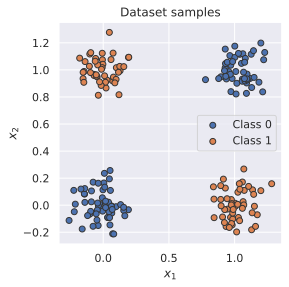

In [11]:
visualize_samples(dataset.data, dataset.label)
plt.show()

In [12]:
# batch_size: Number of samples to stack per batch
# shuffle: If True, the data is returned in a random order. This is important during training for introducing stochasticity.
# num_workers: Number of subprocesses to use for data loading. The default, 0, means that the data will be loaded in the main process which can slow down training for datasets where loading a data point takes a considerable amount of time (e.g. large images). More workers are recommended for those, but can cause issues on Windows computers. For tiny datasets as ours, 0 workers are usually faster.
# pin_memory: If True, the data loader will copy Tensors into CUDA pinned memory before returning them. This can save some time for large data points on GPUs. Usually a good practice to use for a training set, but not necessarily for validation and test to save memory on the GPU.
# drop_last: If True, the last batch is dropped in case it is smaller than the specified batch size. This occurs when the dataset size is not a multiple of the batch size. Only potentially helpful during training to keep a consistent batch size.

data_loader = data.DataLoader(dataset, batch_size=8, shuffle=True)
# next(iter(...)) catches the first batch of the data loader
# If shuffle is True, this will return a different batch every time we run this cell
# For iterating over the whole dataset, we can simply use "for batch in data_loader:..."
data_inputs, data_labels = next(iter(data_loader))

# The shape of the outputs are [batch_size, d_1, ..., d_N] where d_1, ..., d_N are the dimensions of the data point returned from the dataset class
print("Data inputs", data_inputs.shape, "\n", data_inputs)
print("Data labels", data_labels.shape, "\n", data_labels)


Data inputs torch.Size([8, 2]) 
 tensor([[-0.0609,  1.0642],
        [ 0.0468,  1.2772],
        [ 0.0360, -0.0206],
        [-0.1380,  1.0614],
        [-0.0577,  1.0847],
        [ 0.0178,  0.0300],
        [-0.0949,  1.1276],
        [ 1.0593,  0.1714]])
Data labels torch.Size([8]) 
 tensor([1, 1, 0, 1, 1, 0, 1, 1])


In [13]:
loss_module = nn.BCEWithLogitsLoss() # Preferred over BCELoss due to better numerical stability

In [14]:
# Input to the optimizer are the parameters of the model: model.parameters()
optimizer = torch.optim.SGD(model.parameters(), lr=0.1)

In [15]:
train_dataset = XORDataset(size=2500)
train_data_loader = data.DataLoader(train_dataset, batch_size=128, shuffle=True)

In [16]:
# Push model to device. Has to only be done once
model.to(device)

SimpleClassifier(
  (linear1): Linear(in_features=2, out_features=4, bias=True)
  (act_fn): Tanh()
  (linear2): Linear(in_features=4, out_features=1, bias=True)
)

In [17]:
def train_model(model, optimizer, data_loader, loss_module, num_epochs=100):
  # Set model to train mode
  model.train()

  # Training loop
  for epoch in tqdm(range(num_epochs)):
    for data_inputs, data_labels in data_loader:

      ## Step 1: Move input data to device (only strictly necessary if we use GPU)
      data_inputs = data_inputs.to(device)
      data_labels = data_labels.to(device)

      ## Step 2: Run the model on the input data
      preds = model(data_inputs)
      preds = preds.squeeze(dim=1) # Output is [batch_size, 1], but we want [Batch_size]

      ## Step 3: Calculate the loss
      loss = loss_module(preds, data_labels.float())

      ## Step 4: Perform backpropagation
      # Before calculating the gradients, we need to ensure that they are all zero
      # The gradients would not be overwritten, but actually added to the existing ones
      optimizer.zero_grad()
      # Perform backpropagation
      loss.backward()

      ## Step 5: Update the parameters
      optimizer.step()

In [18]:
train_model(model, optimizer, train_data_loader, loss_module)

  0%|          | 0/100 [00:00<?, ?it/s]

In [19]:
state_dict = model.state_dict()
print(state_dict)

OrderedDict([('linear1.weight', tensor([[ 3.1190,  3.4763],
        [-1.4766,  1.9290],
        [-2.1867, -1.7738],
        [-1.2963,  0.0423]], device='cuda:0')), ('linear1.bias', tensor([-1.5264,  1.0014,  2.9568,  0.3627], device='cuda:0')), ('linear2.weight', tensor([[ 4.8970, -2.6240,  3.8839,  1.7804]], device='cuda:0')), ('linear2.bias', tensor([-2.1012], device='cuda:0'))])


In [20]:
# torch.save(object, filename). For the filename, any extension can be used
torch.save(state_dict, "XORmodel.tar")

In [22]:
# Load state dict from the disk
state_dict = torch.load("XORmodel.tar")

# Create a new model and load thestate
new_model = SimpleClassifier(num_inputs=2, num_hidden=4, num_outputs=1)
new_model.load_state_dict(state_dict)

# Verify that the parameters are the same
print("Original model\n", model.state_dict())
print("\nLoaded model\n", new_model.state_dict())

Original model
 OrderedDict([('linear1.weight', tensor([[ 3.1190,  3.4763],
        [-1.4766,  1.9290],
        [-2.1867, -1.7738],
        [-1.2963,  0.0423]], device='cuda:0')), ('linear1.bias', tensor([-1.5264,  1.0014,  2.9568,  0.3627], device='cuda:0')), ('linear2.weight', tensor([[ 4.8970, -2.6240,  3.8839,  1.7804]], device='cuda:0')), ('linear2.bias', tensor([-2.1012], device='cuda:0'))])

Loaded model
 OrderedDict([('linear1.weight', tensor([[ 3.1190,  3.4763],
        [-1.4766,  1.9290],
        [-2.1867, -1.7738],
        [-1.2963,  0.0423]])), ('linear1.bias', tensor([-1.5264,  1.0014,  2.9568,  0.3627])), ('linear2.weight', tensor([[ 4.8970, -2.6240,  3.8839,  1.7804]])), ('linear2.bias', tensor([-2.1012]))])


<ipython-input-22-85c62934be31>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load("XORmodel.tar")


In [23]:
test_dataset = XORDataset(size=500)
# drop_last -> Don't drop the last batch although it is smaller than 128
test_data_loader = data.DataLoader(test_dataset, batch_size=128, shuffle=False, drop_last=False)

In [24]:
def eval_model(model, data_loader):
  model.eval() # Set model to eval mode
  true_preds, num_preds = 0., 0.

  with torch.no_grad(): # Deactivate gradients for the following code
    for data_inputs, data_labels in data_loader:

      # Determine prediction of model on dev set
      data_inputs, data_labels = data_inputs.to(device), data_labels.to(device)
      preds = model(data_inputs)
      preds = preds.squeeze(dim=1)
      preds = torch.sigmoid(preds) # Sigmoid to map predictions between 0 and 1
      pred_labels = (preds >= 0.5).long() # Binarize predictions to 0 and 1

      # Keep records of predictions for the accuracy metric (true_preds=TP+TN, num_preds=TP+TN+FP+FN)
      true_preds += (pred_labels == data_labels).sum()
      num_preds += data_labels.shape[0]

    acc = true_preds / num_preds
    print(f"Accuracy of the model: {100.0*acc:4.2f}%")

In [25]:
eval_model(model, test_data_loader)

Accuracy of the model: 100.00%


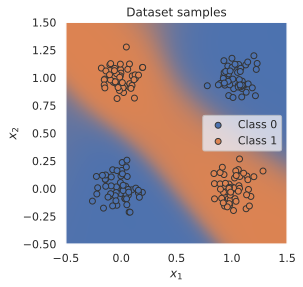

In [29]:
@torch.no_grad() # Decorator, same effect as "with torch.no_grad(): ..." over the whole function
def visualize_classification(model, data, label):
  if isinstance(data, torch.Tensor):
    data = data.cpu().numpy()
  if isinstance(label, torch.Tensor):
    label = label.cpu().numpy()
  data_0 = data[label==0]
  data_1 = data[label==1]

  fig = plt.figure(figsize=(4,4), dpi=500)
  plt.scatter(data_0[:,0], data_0[:,1], edgecolor="#333", label="Class 0")
  plt.scatter(data_1[:,0], data_1[:,1], edgecolor="#333", label="Class 1")
  plt.title("Dataset samples")
  plt.ylabel(r"$x_2$")
  plt.xlabel(r"$x_1$")
  plt.legend()

  # Let's make use of a lot of operations we have learned above
  model.to(device)
  c0 = torch.Tensor(to_rgba("C0")).to(device)
  c1 = torch.Tensor(to_rgba("C1")).to(device)
  x1 = torch.arange(-0.5, 1.5, step=0.01, device=device)
  x2 = torch.arange(-0.5, 1.5, step=0.01, device=device)
  xx1, xx2 = torch.meshgrid(x1, x2, indexing='ij') # Meshgrid function as in numpy
  model_inputs = torch.stack([xx1,xx2], dim=-1)
  preds = model(model_inputs)
  preds = torch.sigmoid(preds)
  output_image = (1 - preds) * c0[None, None] + preds * c1[None, None] # Specifying "None" in a dimension creates a new one
  output_image = output_image.cpu().numpy() # Convert to numpy array. This only works for tensors on CPU, hence first push to CPU
  plt.imshow(output_image, origin='lower', extent=(-0.5,1.5,-0.5,1.5))
  plt.grid(False)
  return fig

_ = visualize_classification(model, dataset.data, dataset.label)
plt.show()

In [31]:
# Import tensorboard logger from PyTorch
from torch.utils.tensorboard import SummaryWriter

# Load tensorboard extension for Jupyter Notebook, only need to start TB in the notebook
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [32]:
def train_model_with_logger(model, optimizer, data_loader, loss_module, val_dataset, num_epochs=100, logging_dir='runs/our_experiment'):
  # Create TensorBoard logger
  writer = SummaryWriter(logging_dir)
  model_plotted = False

  # Set model to train mode
  model.train()

  # Training loop
  for epoch in tqdm(range(num_epochs)):
    epoch_loss = 0.0
    for data_inputs, data_labels in data_loader:

      ## Step 1: Move input data to device (only strictly necessary if we use GPU)
      data_inputs = data_inputs.to(device)
      data_labels = data_labels.to(device)

      # For the very first batch, we visualize the computation graph in TensorBoard
      if not model_plotted:
        writer.add_graph(model, data_inputs)
        model_plotted = True

      ## Step 2: Run the model on the input data
      preds = model(data_inputs)
      preds = preds.squeeze(dim=1) # Output is [Batch size, 1], but we want [Batch size]

      ## Step 3: Calculate the loss
      loss = loss_module(preds, data_labels.float())

      ## Step 4: Perform backpropagation
      # Before calculating the gradients, we need to ensure that they are all zero
      # The gradients would not be overwritten, but actually added to the existing ones
      optimizer.zero_grad()
      # Perform backpropagation
      loss.backward()

      ## Step 5: Update the parameters
      optimizer.step()

      # Step 6: Take the running average of the loss
      epoch_loss += loss.item()

    epoch_loss /= len(data_loader)
    writer.add_scalar('training_loss', epoch_loss, global_step = epoch + 1)

    # Visualize prediction and add figure to TensorBoard
    # Since matplotlib figures can be slow in rendering, we only do it every 10th epoch
    if (epoch + 1) % 10 == 0:
      fig = visualize_classification(model, val_dataset.data, val_dataset.label)
      writer.add_figure('predictions', fig, global_step = epoch + 1)

  writer.close()

In [34]:
model = SimpleClassifier(num_inputs=2, num_hidden=4, num_outputs=1).to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=0.1)
train_model_with_logger(model, optimizer, train_data_loader, loss_module, val_dataset=dataset)

  0%|          | 0/100 [00:00<?, ?it/s]

In [35]:
%tensorboard --logdir runs/our_experiment/

<IPython.core.display.Javascript object>